### Imports

In [1]:
# General
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import re
from tqdm import tqdm
import plotly.graph_objects as go
import plotly.express as px
import capir_transfronteriza2_2023.data.load as load

# Topic modeling
from sentence_transformers import SentenceTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.feature_extraction.text import TfidfVectorizer
from umap import UMAP
from sklearn.cluster import KMeans
from hdbscan import HDBSCAN

/home/fxr/.local/share/virtualenvs/capir_transfronteriza2_2023-f1a4fPBO/lib/python3.8/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/fxr/.local/share/virtualenvs/capir_transfronteriza2_2023-f1a4fPBO/lib/python3.8/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit(

### Load data

In [ ]:
data_processed = load.data_processed
assets = load.assets

### Read data

In [29]:
data = pd.read_csv(f"{data_processed}/colombia.csv")

print(data.shape)

data.head(3)

(57477, 4)


,user_screen_name,country,text,text_clean
0,MariaFdaCabal,Colombia,Peligro que personas señaladas por Rosa Blanca...,Peligro que personas señaladas por Rosa Blanca...
1,MariaFdaCabal,Colombia,¡Al fin! El gobierno de la potencia mundial de...,¡Al fin! El gobierno de la potencia mundial de...
2,MariaFdaCabal,Colombia,"Qué buen artículo. ""Sandeces democratíceras"". ...","Qué buen artículo. ""Sandeces democratíceras""."


### Process data

In [31]:
country = data[data['text_clean'].apply(lambda x: isinstance(x, (str, bytes)))]

print(country.shape)

(54974, 4)


### Create embeddings

In [30]:
# Load model to generate embeddings
sbert_model = SentenceTransformer('all-MiniLM-L6-v2')

In [32]:
# Process data with encoder
vecs = sbert_model.encode(country["text_clean"].values)

In [33]:
# Apply the dimensionality reduction process.

# Scaler to normalize data
scaler = StandardScaler()
# PCA to reduce multicollinearity and noise
pca_ = PCA(0.9, random_state=5)
# UMAP to reduce dimensionality to two components
umap_ = UMAP(n_components=2,
             random_state=5,
             metric="cosine",
             n_neighbors=50,
             min_dist=0.1)

vecs_sc = scaler.fit_transform(vecs)
vecs_pca = pca_.fit_transform(vecs_sc)
vecs_umap = umap_.fit_transform(vecs_pca)

In [34]:
# Assign components to dataset
country.loc[:,"COMP_1"] = vecs_umap[:,0]
country.loc[:,"COMP_2"] = vecs_umap[:,1]

# Show data
country.head()

/tmp/ipykernel_5813/4075971638.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_5813/4075971638.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,user_screen_name,country,text,text_clean,COMP_1,COMP_2
0,MariaFdaCabal,Colombia,Peligro que personas señaladas por Rosa Blanca...,Peligro que personas señaladas por Rosa Blanca...,5.661910,2.847879
1,MariaFdaCabal,Colombia,¡Al fin! El gobierno de la potencia mundial de...,¡Al fin! El gobierno de la potencia mundial de...,4.021524,2.784703
2,MariaFdaCabal,Colombia,"Qué buen artículo. ""Sandeces democratíceras"". ...","Qué buen artículo. ""Sandeces democratíceras"".",4.688560,3.120051
3,MariaFdaCabal,Colombia,Los izquierdópatas en Colombia aplauden el lem...,Los izquierdópatas en Colombia aplauden el lem...,6.964063,4.052229
4,MariaFdaCabal,Colombia,Denuncian llegada de presuntos colectivos vene...,Denuncian llegada de presuntos colectivos vene...,4.018866,4.329624


In [35]:
# Visualize the distribution of embeddings with a hover to see the tweets.
fig = px.scatter(
    country,
    x="COMP_1",
    y="COMP_2",
    hover_data=["text_clean"])
fig.write_html(f"{assets}/colombia/colombia.html")
fig.show()

### Clustering

In [44]:
# Apply the HDBSCAN algorithm to extract the clusters.

mc_size = 150
m_samples = 1

db_model = HDBSCAN(min_cluster_size=mc_size,
                   min_samples=m_samples,
                   metric="euclidean", 
                   )
db_model.fit(country.loc[:,["COMP_1", "COMP_2"]])
country.loc[:, "CLUSTER"] = db_model.labels_
country.loc[:, "PROBA"] = db_model.probabilities_

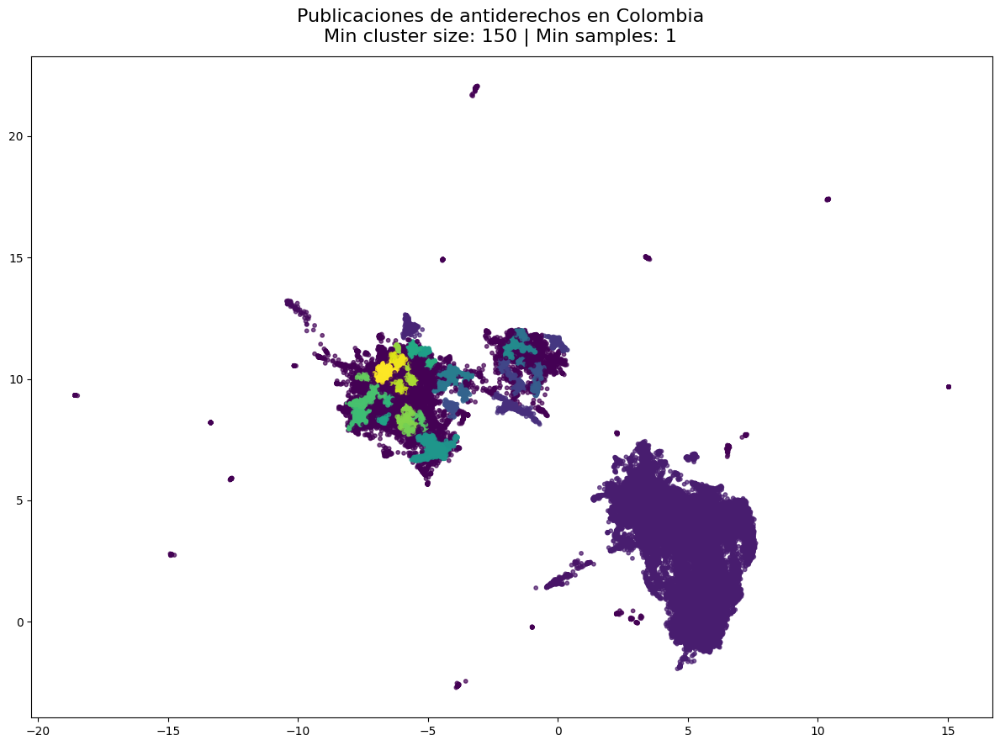

In [45]:
# Visualize clusters
plt.figure(figsize=(12,9))
plt.scatter(vecs_umap[:,0], vecs_umap[:,1], alpha=0.7, c=db_model.labels_, s=10)
plt.suptitle(f"Publicaciones de antiderechos en Colombia\nMin cluster size: {mc_size} | Min samples: {m_samples}", fontsize=16)
plt.tight_layout()
plt.savefig(f"{assets}/colombia/colombia_clusters")
plt.show()

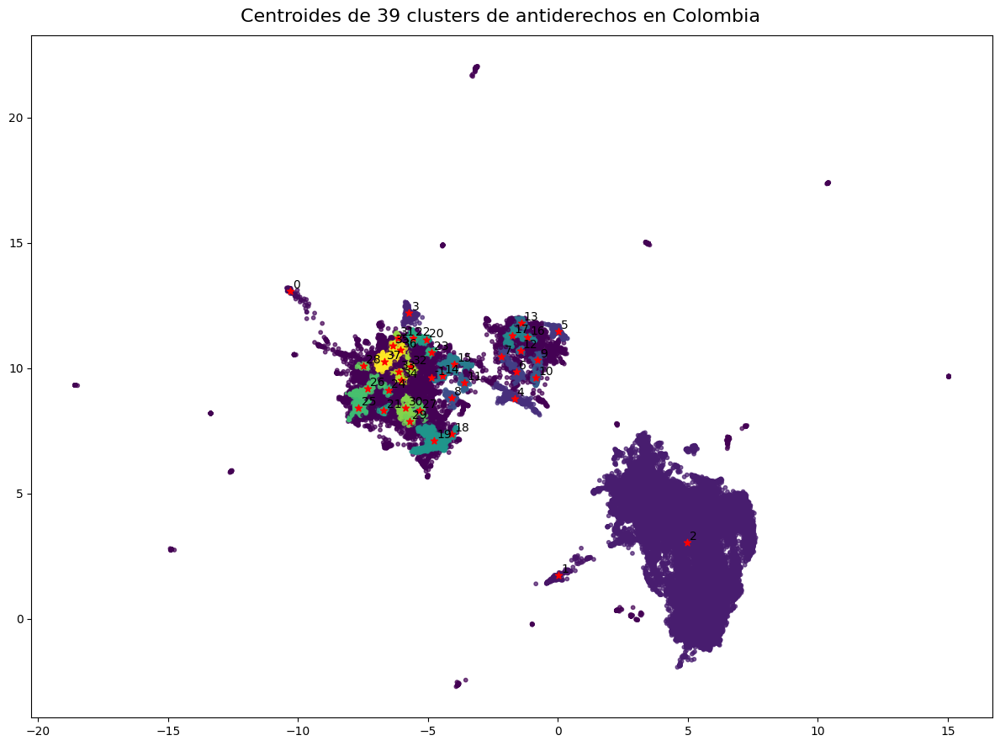

In [46]:
# Extract the centroid of each cluster

cl_centroids = {}

for i in sorted(country["CLUSTER"].unique()):

  cl_centroids[i] = country[country["CLUSTER"] == i][["COMP_1", "COMP_2"]].mean().values

centroids_array = np.array(list(cl_centroids.values()))

fig, ax = plt.subplots(figsize=(12,9))
ax.scatter(vecs_umap[:,0], vecs_umap[:,1], s=10, alpha=0.7, c=db_model.labels_)
ax.scatter(centroids_array[:,0], centroids_array[:,1], marker="*", c="red")
for i in cl_centroids:
  ax.annotate(i, cl_centroids.get(i)+np.array([0.1, 0.1]))
plt.suptitle(f"Centroides de {len(cl_centroids)} clusters de antiderechos en Colombia", fontsize=16)
plt.tight_layout()
plt.savefig(f"{assets}/colombia/colombia_centroids", dpi=fig.dpi)
plt.show()

In [47]:
from sklearn.metrics.pairwise import euclidean_distances

N = 10

for i in cl_centroids:
  point = cl_centroids.get(i).reshape(1,-1)
  ix_min_dist = np.argsort(euclidean_distances(point, country.loc[:, ["COMP_1", "COMP_2"]])).flatten()[:N]
  print(f"Tweets más representativos del cluster {i}")
  print(country.iloc[ix_min_dist, 
                      country.columns.get_loc("text_clean")].values, "\n")

Tweets más representativos del cluster -1
['Buenos días, seguimos apoyando al $HASHTAG$ y ahora más que nunca $HASHTAG$ $HASHTAG$'
 'Buenos dias, hoy es viernes ultimo dia para concluir nuestras cosas en el trabajo. Feliz Viernes $HASHTAG$ $HASHTAG$ $HASHTAG$'
 'Buenos días; hoy es vienes, les deseo un muy feliz día lleno de alegrías Feliz viernes $HASHTAG$'
 '$MENTION$ buenos días, lo puede bajar de $HASHTAG$'
 'Buenos días, como amanecen los que le dicen $HASHTAG$? Feliz día para todos'
 'Buenos días continuamos con el $HASHTAG$ $HASHTAG$ $HASHTAG$ Feliz jueves'
 'Buenos días, como amanece la $HASHTAG$ de verdad, la que $HASHTAG$. Feliz viernes'
 'Buenos Días, seguimos preparando nuestra $HASHTAG$'
 'Buenos dias; nuevo mes, nuevos retos. Seguimos apoyando al $HASHTAG$ y mas ahora cuando $HASHTAG$ quiere sacarlo'
 'Buenos días; hoy es viernes, día para concluir la semana laboral. Feliz Viernes $HASHTAG$ $HASHTAG$ $HASHTAG$'] 

Tweets más representativos del cluster 0
['$HASHTAG$ | Sin